## DATA EXPLORATION
In this notebook we explore distributions of various aspects of the data, With the intent of understanding the dataset a bit better and to find any eventual outlier.

In [1]:
from buildDataset import *
%matplotlib inline

from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,precision_score,recall_score,confusion_matrix,ConfusionMatrixDisplay,f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
root_path =      DATAPATHS["preprocessed"]
from sklearn.model_selection import KFold


C:\Users\line\Desktop\Mauro\2_Preprocessing_Code\amd\prl\dataset.py:8: FutureWarning: The `skimage.morphology.selem` module is deprecated and will be removed in scikit-image 1.0 (`skimage.morphology.selem` has been moved to `skimage.morphology.footprints`).
  from skimage.morphology import selem


In [2]:
root_path

'C:\\Users\\line\\Desktop\\Mauro\\preprocessing\\preprocessed_octs'

In [3]:
import random
def checkNditribution(root_path):
    def fix(ls):
        ls2 = []
        if '+' in ls:
            ls2.append( os.path.split(ls.split("+")[0])[1].split(".")[0] ) 
            ls2.append( os.path.split(ls.split("+")[1])[1].split(".")[0] )
        else:
            ls2.append(os.path.split(ls)[1].split(".")[0])
        return (" ").join(ls2)    

    paths =  glob.glob(os.path.join(root_path + '\*.pickle'))
    paths_amd = []
    paths_control = []
    num_amd = []
    num_control = []
    rateoAmd = []
    rateoControl = []
    total_amd = 0
    total_control = 0
    iterator = iter(range(0,len(paths)))
    AMDtwoEyesSamePatient = []
    CtrltwoEyesSamePatient = []

    # Attraversa tutti i paths, che sono per i singoli occhi, ma li vogliamo per paziente
    for i in iterator:
        group = paths[i].split("\\").pop().split("_")[0]
        # Check if the two next paths are of the same patient (left and right eye), if the case we treat them as one
        two_eyes_same_patient = paths[i].split("\\")[-1].split("_")[:-1]==paths[i+1].split("\\")[-1].split("_")[:-1]
        if(two_eyes_same_patient):
            if group == 'amd':
                AMDtwoEyesSamePatient.append((len(pd.read_pickle(paths[i])),len(pd.read_pickle(paths[i + 1]))))
            else:
                CtrltwoEyesSamePatient.append((len(pd.read_pickle(paths[i])),len(pd.read_pickle(paths[i + 1]))))
            PPocts = pd.read_pickle(paths[i]) + pd.read_pickle(paths[i + 1]) 
            path = paths[i] + '+' + paths[i+1]
            next(iterator, None)
            print(i,fix(path),len(pd.read_pickle(paths[i])),len(pd.read_pickle(paths[i + 1])) )
        else:
            PPocts =pd.read_pickle(paths[i])
            path = paths[i]
            print(i,fix(path),len(pd.read_pickle(paths[i])))
        
        num_octs = len(PPocts)
        rateos = [np.sum(PPoct.label())/(PPoct.label().shape[0]) for PPoct in PPocts]
        rateo = np.mean(rateos)
        if (group == 'amd'):
            paths_amd.append(path)
            num_amd.append(num_octs)
            total_amd += num_octs
            rateoAmd.append(rateo) 
        elif (group == 'control'):
            paths_control.append(path)
            num_control.append(num_octs)
            total_control += num_octs
            rateoControl.append(rateo) 
    print(f'the paths cntrl are: {len(paths_control)} with associated nocts{num_control}, the paths amd are: with associated nocts{num_amd}')
    print(f'the rateos for control are {rateoControl} and for amd are {rateoAmd}')
    print(f'the pairs are for control {len(CtrltwoEyesSamePatient)} , for AMD {AMDtwoEyesSamePatient}')

checkNditribution(root_path)

0 amd_0_left amd_0_right 9 49
2 amd_1_left amd_1_right 36 12
4 amd_2_left amd_2_right 27 68
6 amd_3_left amd_3_right 45 62
8 amd_4_left amd_4_right 22 38
10 amd_5_left 19
11 amd_6_left amd_6_right 97 66
13 control_0_left control_0_right 60 14
15 control_10_left control_10_right 16 13
17 control_11_left control_11_right 8 7
19 control_12_left control_12_right 5 9
21 control_1_left control_1_right 0 2
23 control_2_left control_2_right 15 27
25 control_3_left control_3_right 10 10
27 control_4_left control_4_right 10 12
29 control_5_left control_5_right 15 13
31 control_6_left control_6_right 17 4
33 control_7_left control_7_right 57 29
35 control_8_left control_8_right 8 9
37 control_9_left control_9_right 26 37
the paths cntrl are: 13 with associated nocts[74, 29, 15, 14, 2, 42, 20, 22, 28, 21, 86, 17, 63], the paths amd are: with associated nocts[58, 48, 95, 107, 60, 19, 163]
the rateos for control are [0.30310388513513514, 0.04660560344827587, 0.04939236111111111, 0.037109375, 0.05924

In [4]:
ctrlPairs = [(60, 14), (16, 13), (8, 7), (5, 9), (0, 2), (15, 27), (10, 10), (10, 12), (15, 13), (17, 4), (57, 29), (8, 9), (26, 37)]
AMDPairs = [(9, 49), (36, 12), (27, 68), (45, 62), (22, 38), (19,0), (97, 66)]

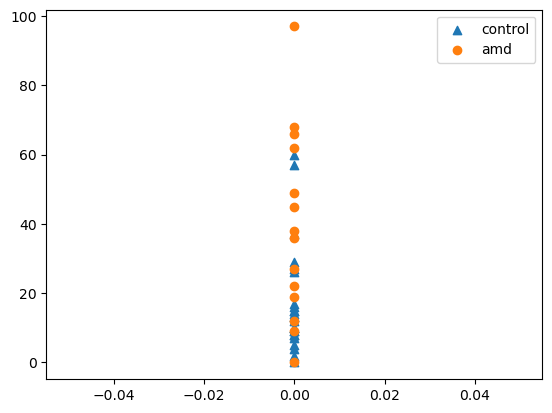

In [5]:
flat_ctrl = [item for sublist in ctrlPairs for item in sublist]
flat_amd = [item for sublist in AMDPairs for item in sublist]
plt.scatter(list(np.zeros(len(flat_ctrl))), flat_ctrl, marker='^',label = 'control')
plt.scatter(list(np.zeros(len(flat_amd))), flat_amd, marker='o',label = 'amd')
plt.legend()
plt.show()

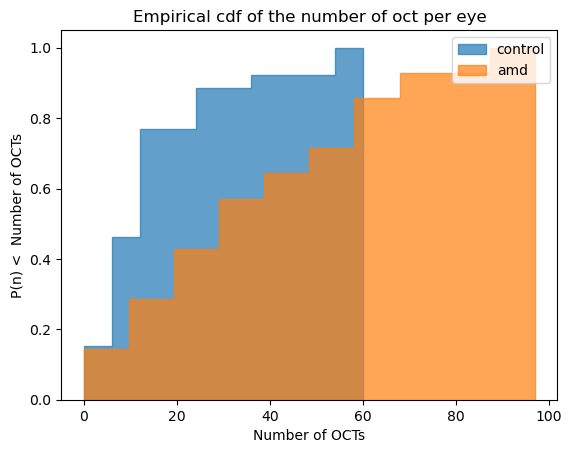

In [6]:
plt.hist(flat_ctrl, density=True, cumulative=True,
         histtype='step', alpha=0.7,label = 'control',fill=True)
plt.hist(flat_amd, density=True, cumulative=True,
         histtype='step', alpha=0.7,label = 'amd',fill=True)
plt.title('Empirical cdf of the number of oct per eye')
plt.xlabel('Number of OCTs')
plt.ylabel('P(n) <  Number of OCTs')
plt.legend()
plt.show()

0.0010015699598524305


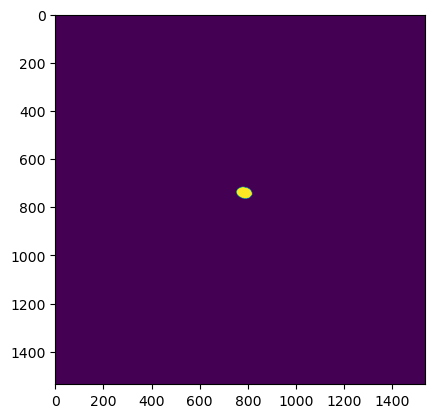

0.0162552727593316


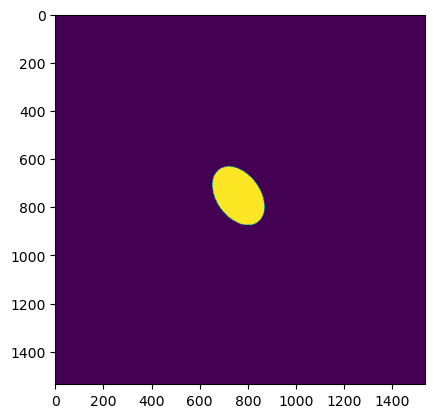

0.009540557861328125


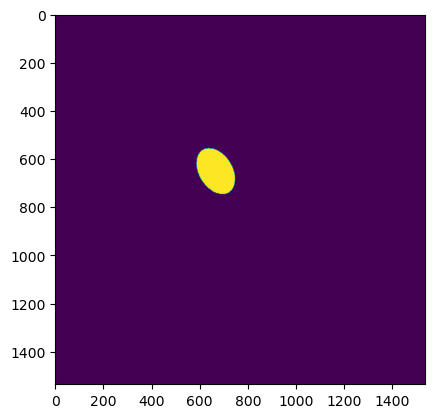

0.00101470947265625


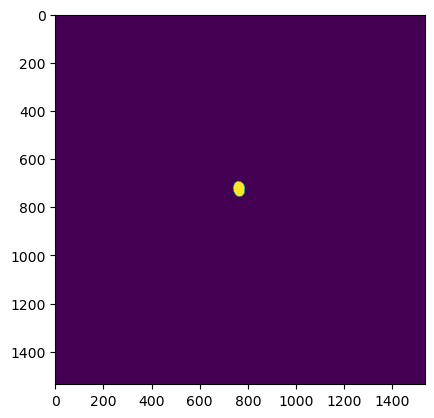

0.016205681694878474


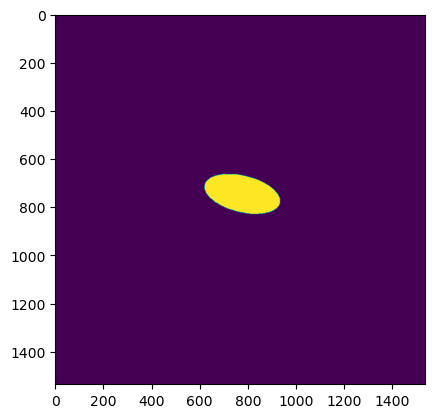

0.03942108154296875


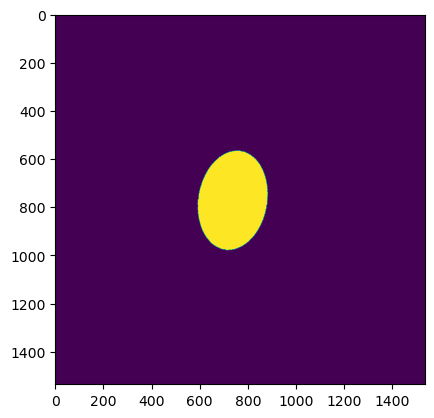

0.03461244371202257


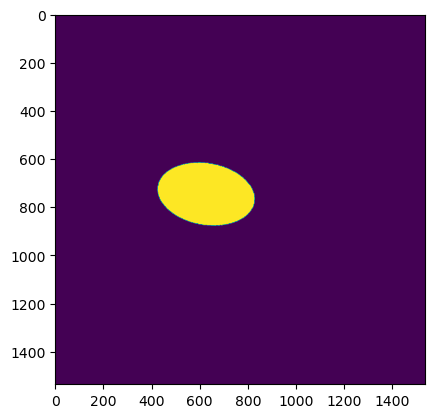

0.029806349012586806


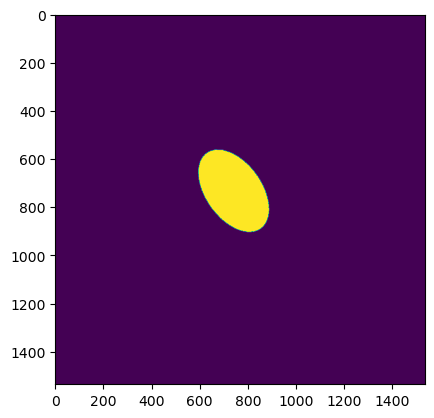

0.061560736762152776


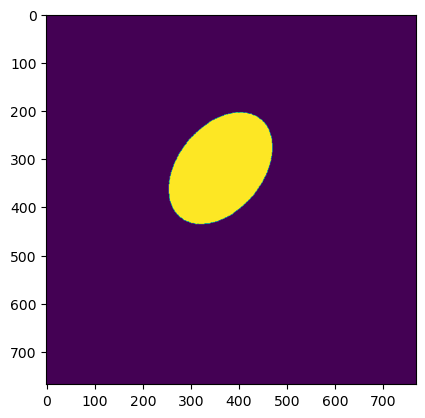

0.10961744520399305


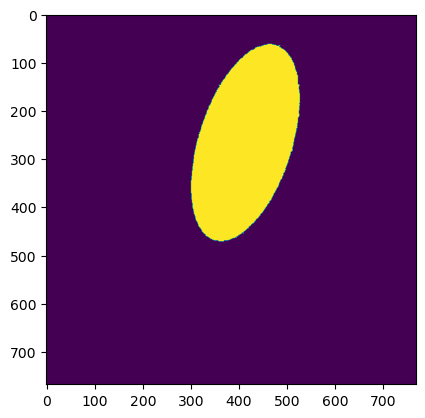

0.041745503743489586


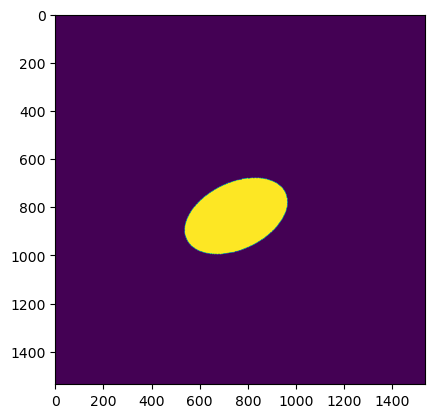

0.16098192003038195


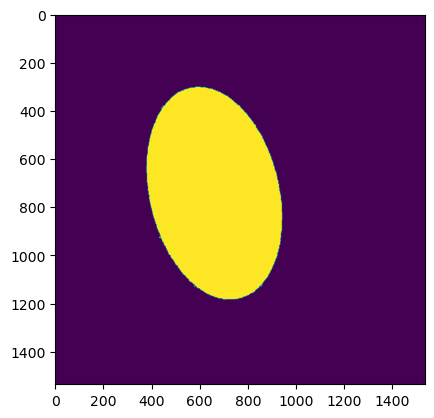

0.04960335625542535


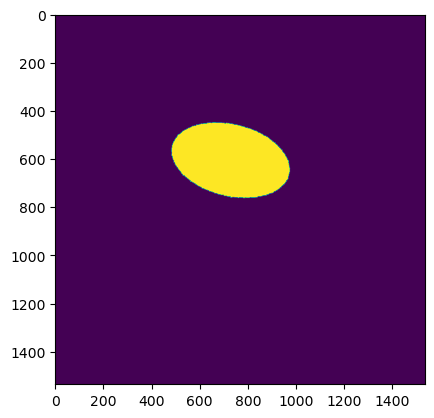

0.04692713419596354


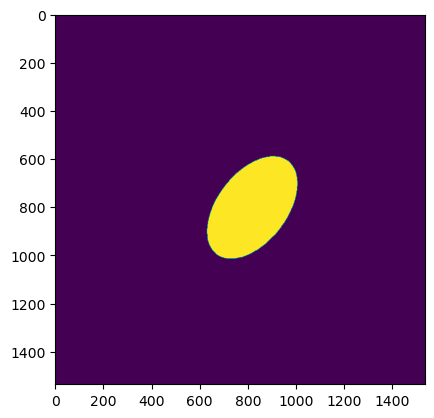

0.032727559407552086


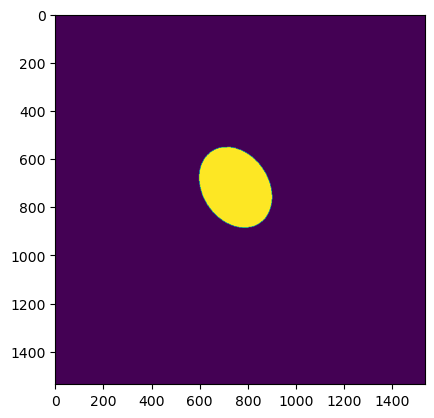

0.0010918511284722222


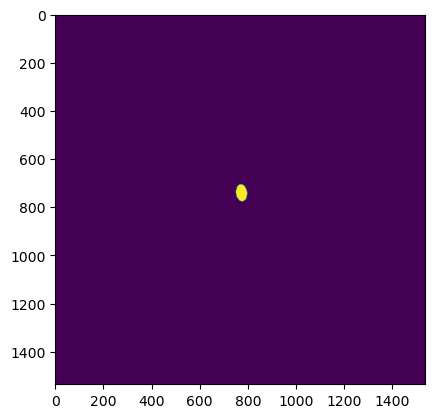

0.001155429416232639


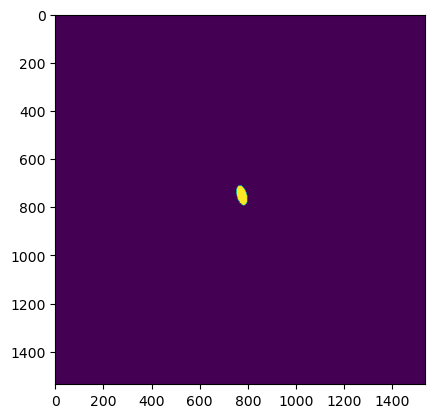

0.000698089599609375


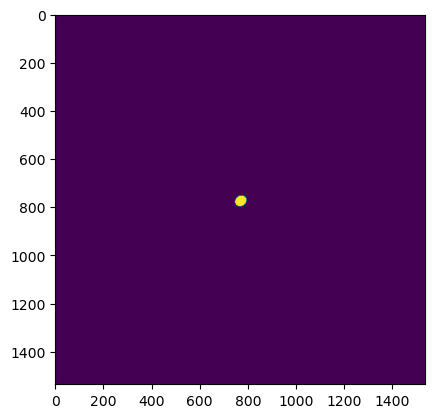

0.0005955166286892361


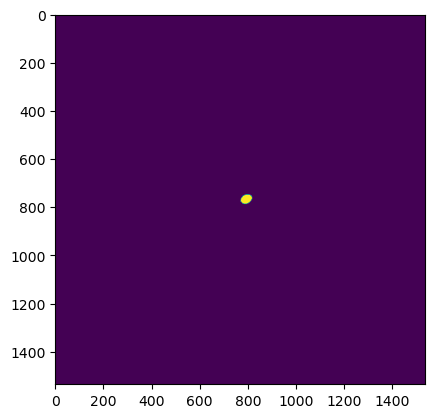

0.0003314548068576389


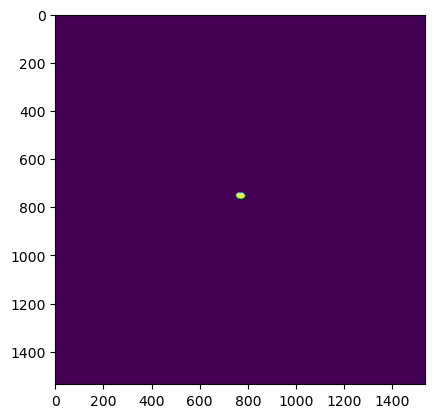

0.000461578369140625


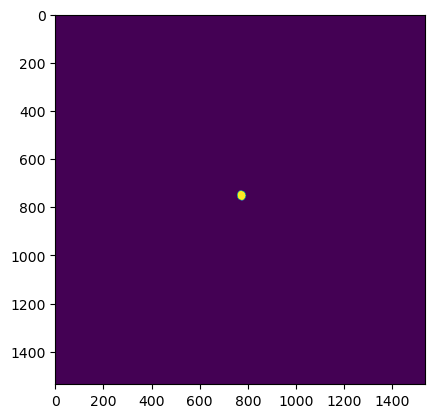

0.0008337232801649305


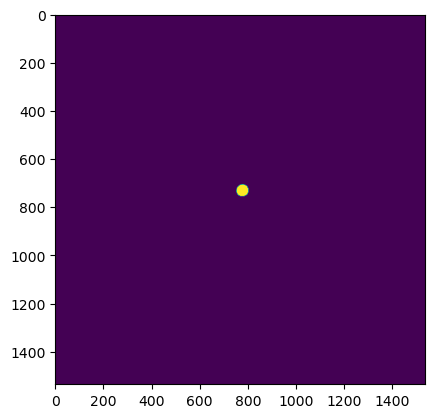

0.0031458536783854165


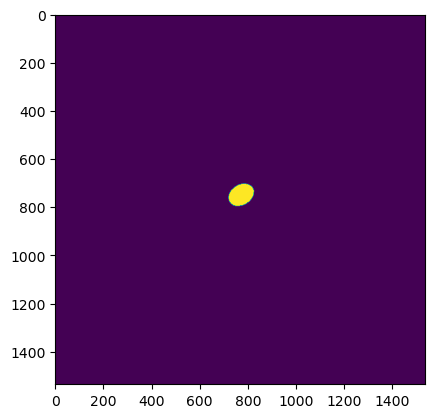

0.004780239529079861


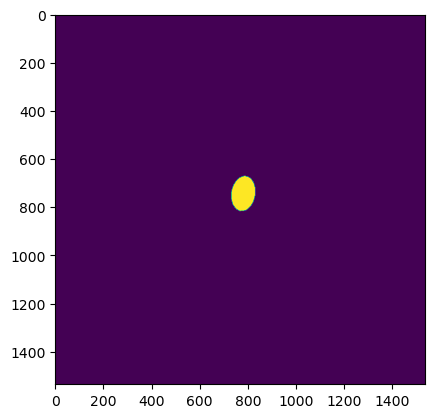

0.0009358723958333334


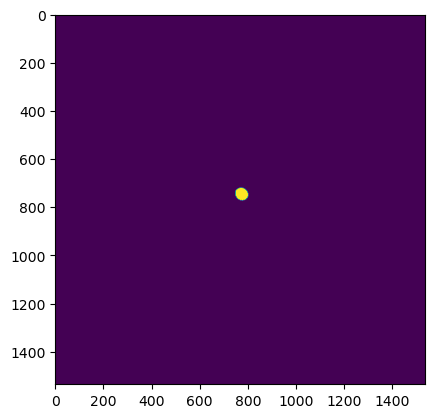

0.0008214314778645834


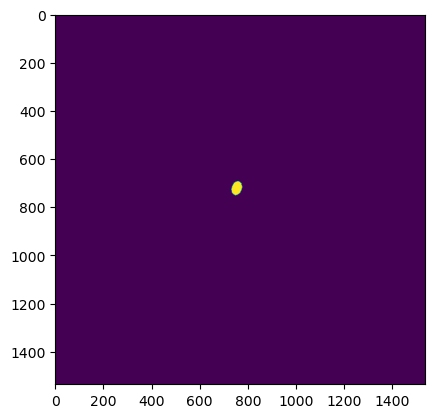

0.0007684495713975695


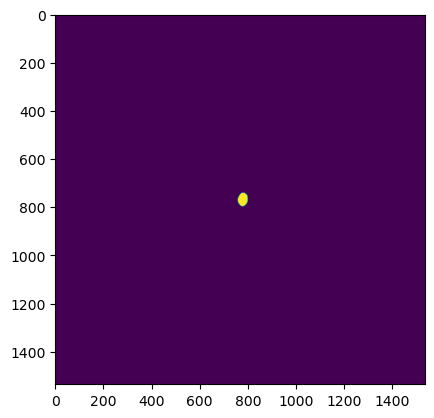

0.0011109246148003472


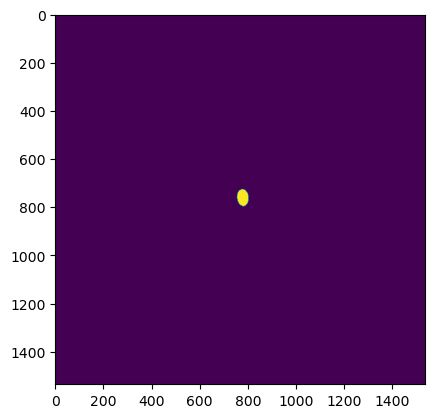

0.0016386244032118055


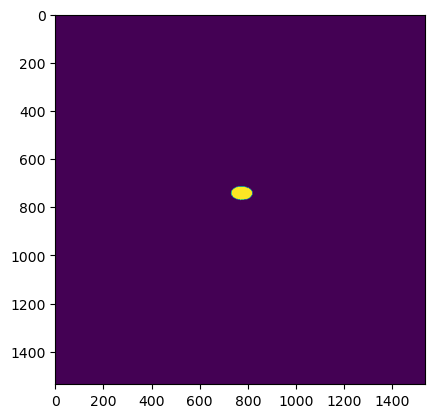

0.0022146436903211805


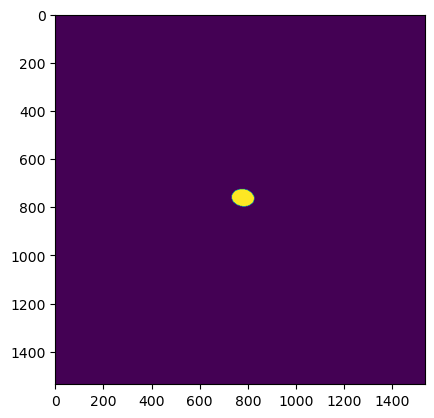

0.0028364393446180555


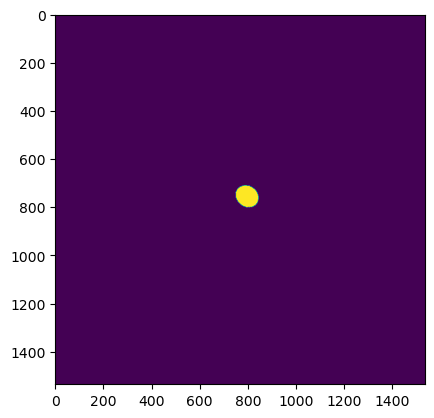

0.0028856065538194445


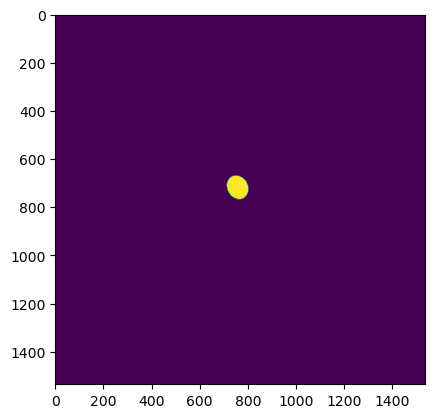

0.011403825547960069


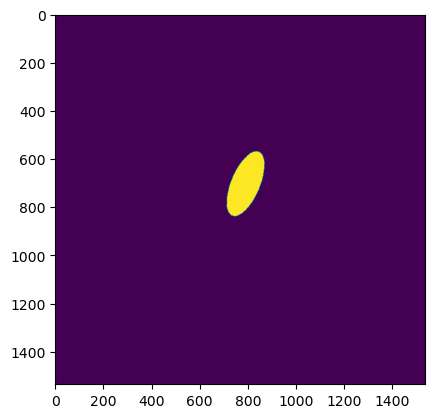

0.007412804497612847


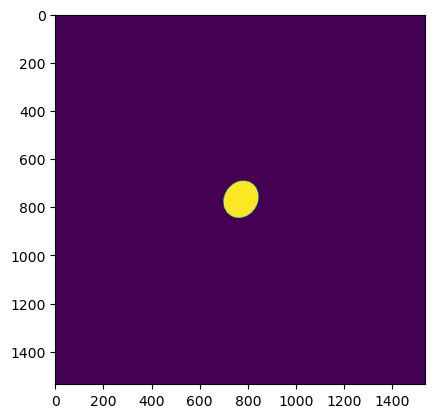

0.0007921854654947916


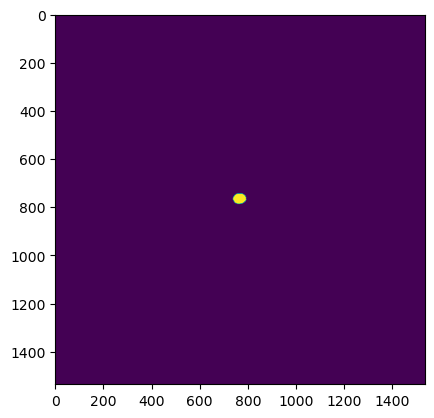

0.0006319681803385416


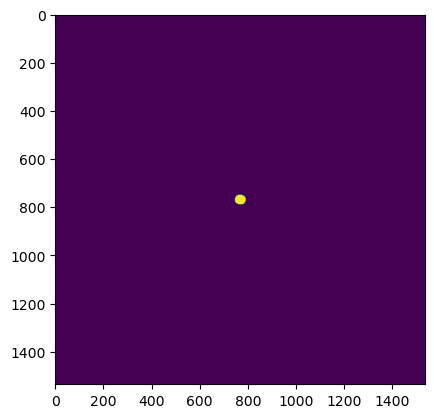

0.004598405626085069


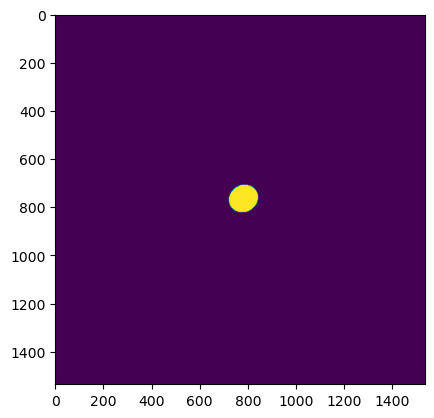

0.006349351671006944


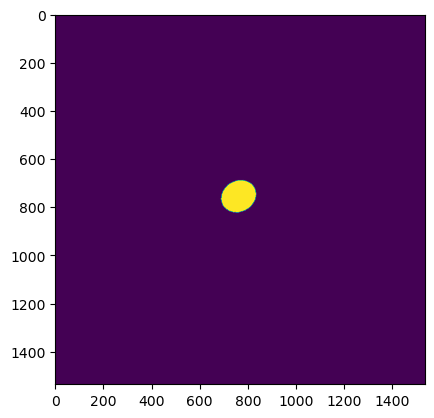

In [7]:
def checkImgsizes(root_path):
    def fix(ls):
        ls2 = []
        if '+' in ls:
            ls2.append( os.path.split(ls.split("+")[0])[1].split(".")[0] ) 
            ls2.append( os.path.split(ls.split("+")[1])[1].split(".")[0] )
        else:
            ls2.append(os.path.split(ls)[1].split(".")[0])
        return (" ").join(ls2)    

    paths =  glob.glob(os.path.join(root_path + '\*.pickle'))
    paths_amd = []
    paths_control = []
    num_amd = []
    num_control = []
    rateoAmd = []
    rateoControl = []
    total_amd = 0
    total_control = 0
    iterator = iter(range(0,len(paths)))
    AMDtwoEyesSamePatient = []
    CtrltwoEyesSamePatient = []

    # Attraversa tutti i paths, che sono per i singoli occhi, ma li vogliamo per paziente
    for i in iterator:
        group = paths[i].split("\\").pop().split("_")[0]
        # Check if the two next paths are of the same patient (left and right eye), if the case we treat them as one
        two_eyes_same_patient = paths[i].split("\\")[-1].split("_")[:-1]==paths[i+1].split("\\")[-1].split("_")[:-1]
        if(two_eyes_same_patient):
            if group == 'amd':
                AMDtwoEyesSamePatient.append((len(pd.read_pickle(paths[i])),len(pd.read_pickle(paths[i + 1]))))
                if len(pd.read_pickle(paths[i])) != 0:
                    print(pd.read_pickle(paths[i])[0].full_label().mean())
                    plt.imshow(pd.read_pickle(paths[i])[0].full_label())
                    plt.show()
                    rateoAmd.append(pd.read_pickle(paths[i])[0].full_label().mean())
                if len(pd.read_pickle(paths[i+1])) != 0:
                    print(pd.read_pickle(paths[i + 1])[0].full_label().mean())
                    plt.imshow(pd.read_pickle(paths[i + 1])[0].full_label())
                    plt.show()
                    rateoAmd.append(pd.read_pickle(paths[i+1])[0].full_label().mean())
            else:
                CtrltwoEyesSamePatient.append((len(pd.read_pickle(paths[i])),len(pd.read_pickle(paths[i + 1]))))
                if len(pd.read_pickle(paths[i])) != 0:
                    print(pd.read_pickle(paths[i])[0].full_label().mean())
                    plt.imshow(pd.read_pickle(paths[i])[0].full_label())
                    plt.show()
                    rateoControl.append(pd.read_pickle(paths[i])[0].full_label().mean())
                if len(pd.read_pickle(paths[i+1])) != 0:
                    print(pd.read_pickle(paths[i + 1])[0].full_label().mean())
                    plt.imshow(pd.read_pickle(paths[i + 1])[0].full_label())
                    plt.show()
                    rateoControl.append(pd.read_pickle(paths[i+1])[0].full_label().mean())
            next(iterator, None)
        else:
            print(pd.read_pickle(paths[i])[0].full_label().mean())
            plt.imshow(pd.read_pickle(paths[i])[0].full_label())
            plt.show()
            if group == 'amd' and len(pd.read_pickle(paths[i])) != 0:
                rateoAmd.append(pd.read_pickle(paths[i])[0].full_label().mean())
            elif len(pd.read_pickle(paths[i])) != 0:
                rateoControl.append(pd.read_pickle(paths[i])[0].full_label().mean())
    return(rateoAmd,rateoControl)
    
rateoAmd,rateoControl = checkImgsizes(root_path)

In [8]:
#Check if all the eyes are here: It's correct
print(len(rateoAmd) + len(rateoControl)) 

38


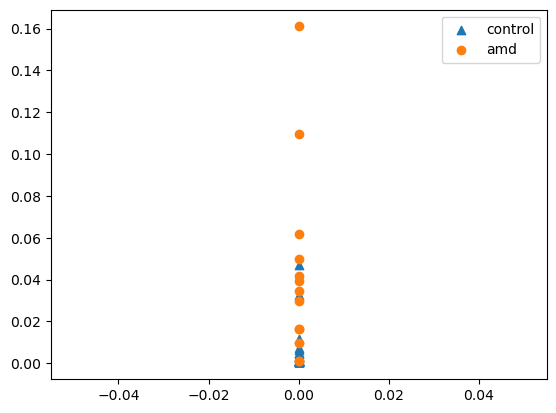

In [9]:
flat_ctrl = [item for sublist in ctrlPairs for item in sublist]
flat_amd = [item for sublist in AMDPairs for item in sublist]
plt.scatter(list(np.zeros(len(rateoControl))), rateoControl, marker='^',label = 'control')
plt.scatter(list(np.zeros(len(rateoAmd))), rateoAmd, marker='o',label = 'amd')
plt.legend()
plt.show()

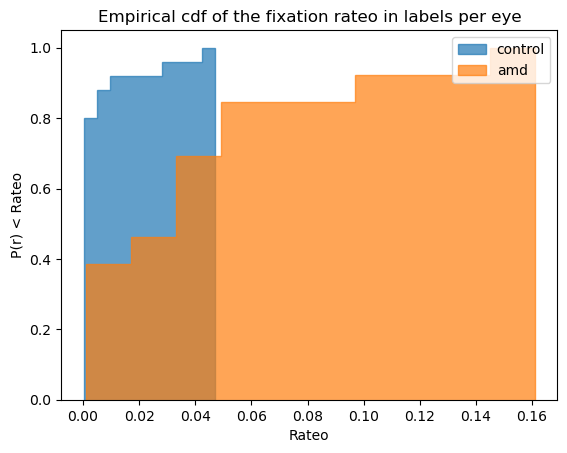

In [10]:
plt.hist(rateoControl, density=True, cumulative=True,
         histtype='step', alpha=0.7,label = 'control',fill=True)
plt.hist(rateoAmd, density=True, cumulative=True,
         histtype='step', alpha=0.7,label = 'amd',fill=True)
plt.title('Empirical cdf of the fixation rateo in labels per eye')
plt.xlabel('Rateo')
plt.ylabel('P(r) < Rateo')
plt.legend()
plt.show()

In [11]:
def checkThickness(root_path):
    amdthk = []
    controlthk = []
    paths =  glob.glob(os.path.join(root_path + '\*.pickle'))
    for path in paths:
        PPocts = pd.read_pickle(path)
        group = path.split("\\").pop().split("_")[0]
        for PPoct in PPocts:
            if group == 'amd':
                amdthk.append(PPoct.image().shape[0])
            else: 
                controlthk.append(PPoct.image().shape[0])
                                  
    return amdthk,controlthk

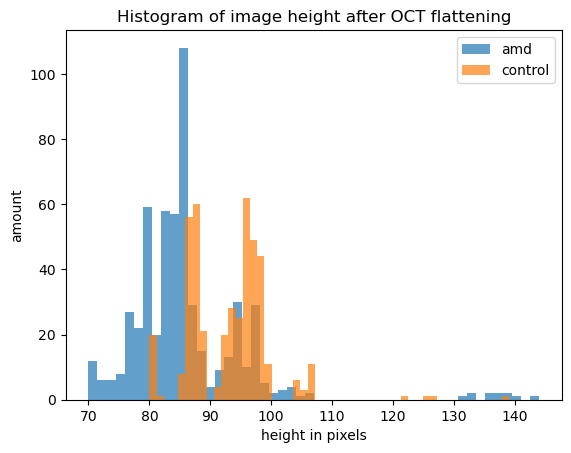

In [12]:
amdthk,controlthk = checkThickness(root_path)
plt.hist(amdthk, bins=50,alpha=0.7,label = 'amd')
plt.hist(controlthk, bins=50,alpha=0.7,label = 'control')
plt.legend()
plt.xlabel('height in pixels')
plt.ylabel('amount')
plt.title("Histogram of image height after OCT flattening")
plt.show()

In [13]:
def checkThickness2(root_path):
    count = 0
    amdthk = []
    controlthk = []
    paths =  glob.glob(os.path.join(root_path + '\*.pickle'))
    for path in paths:
        PPocts = pd.read_pickle(path)
        group = path.split("\\").pop().split("_")[0]
        for PPoct in PPocts:
            if PPoct.image().shape[0] > 100:
                if PPoct.image().shape[0] > 120:
                    print("OK")
                print(path)
                img = PPoct.image()
                segmentation = PPoct
                plt.imshow(img)
                plt.show()
                img2 = PPoct.labelled_segmentation()
                plt.imshow(img2)
                plt.show()
                plt.imshow(img[-105::,:])
                plt.show()
            if group == 'amd':
                amdthk.append(PPoct.image().shape[0])
            else: 
                controlthk.append(PPoct.image().shape[0])
                                  
    return count

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_0_left.pickle


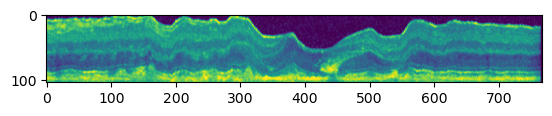

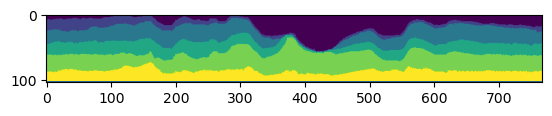

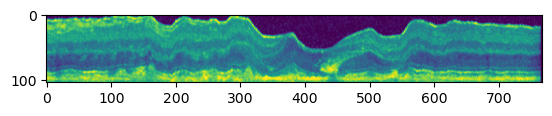

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_0_left.pickle


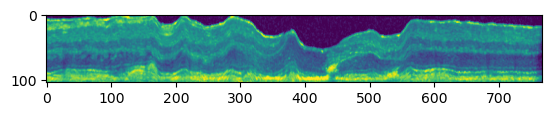

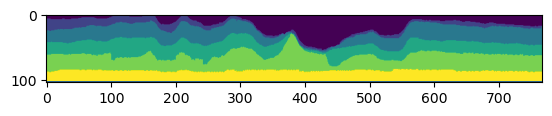

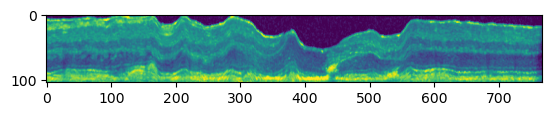

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_0_left.pickle


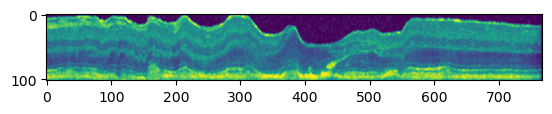

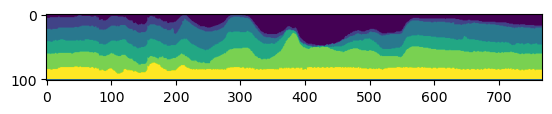

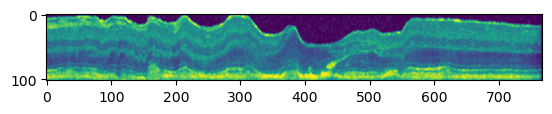

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_0_left.pickle


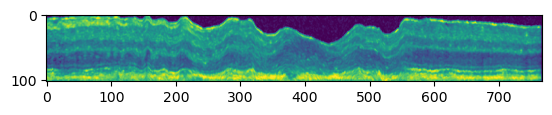

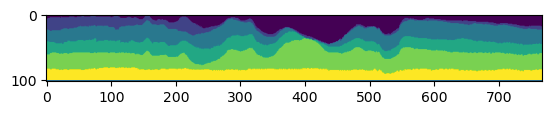

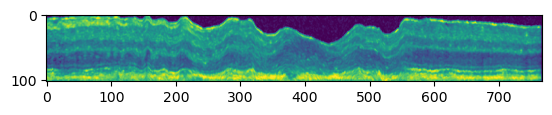

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_0_left.pickle


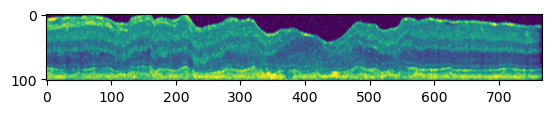

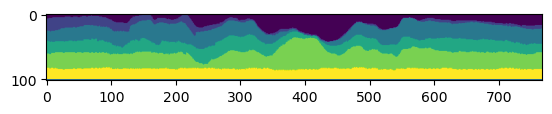

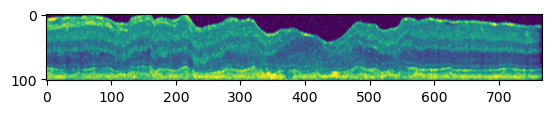

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_0_left.pickle


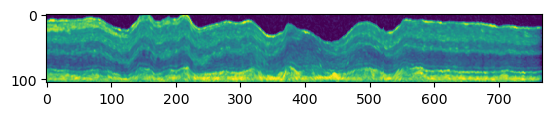

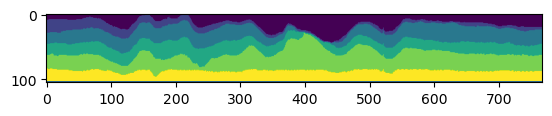

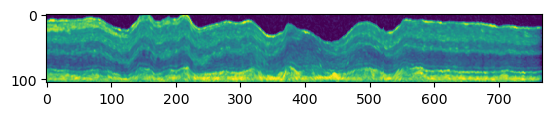

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_0_left.pickle


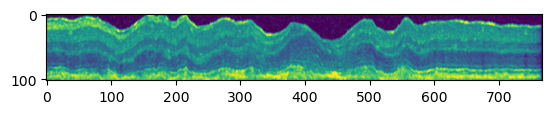

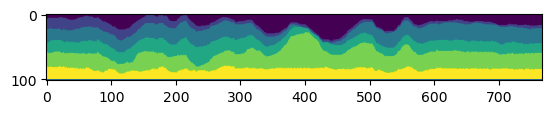

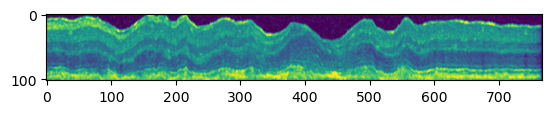

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_0_left.pickle


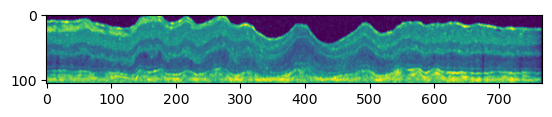

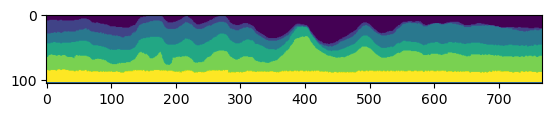

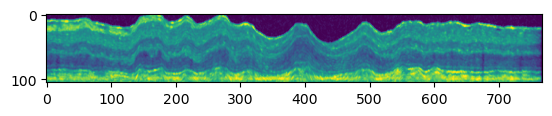

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_0_left.pickle


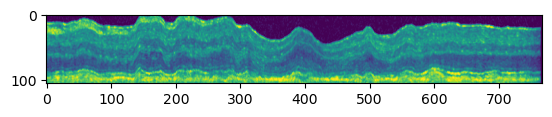

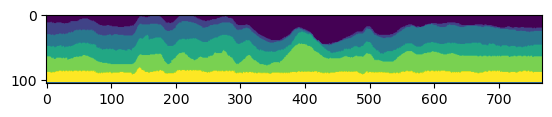

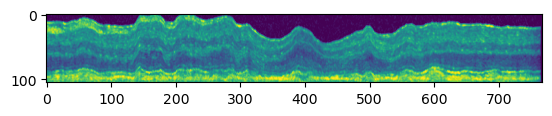

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_1_left.pickle


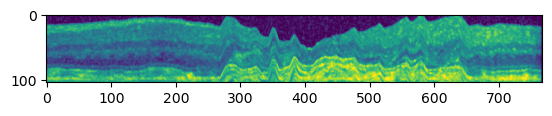

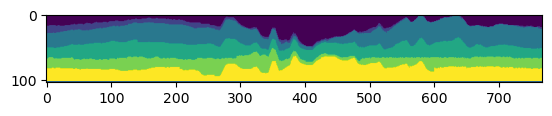

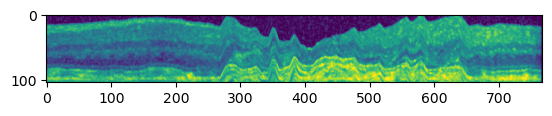

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_2_right.pickle


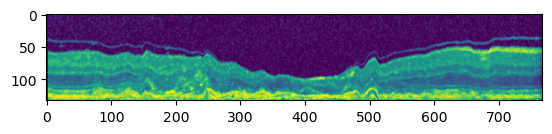

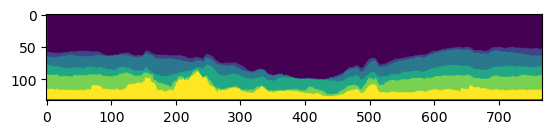

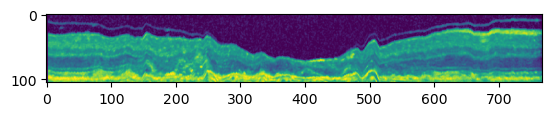

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_3_right.pickle


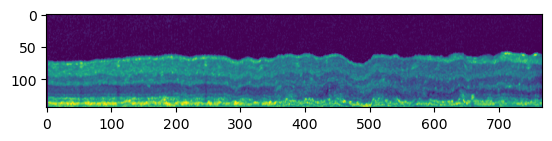

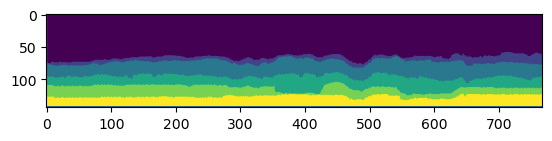

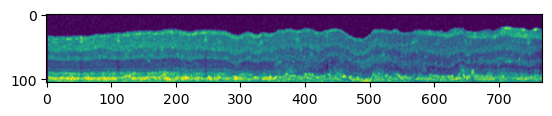

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_3_right.pickle


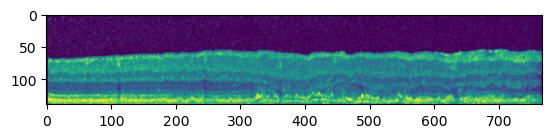

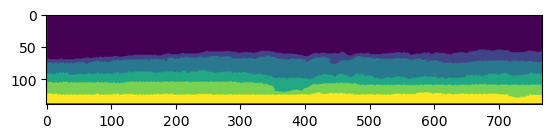

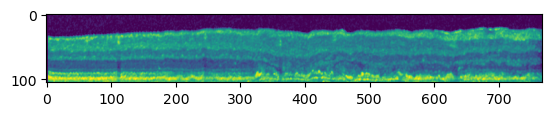

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_3_right.pickle


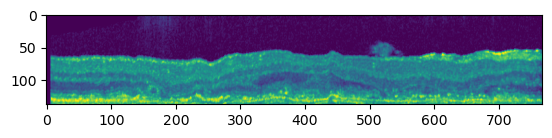

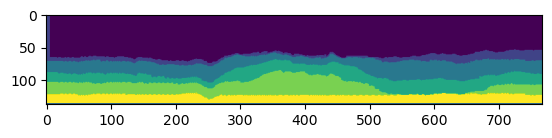

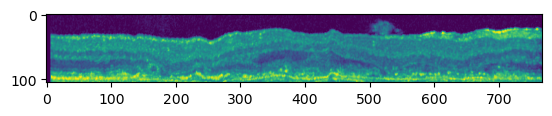

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle


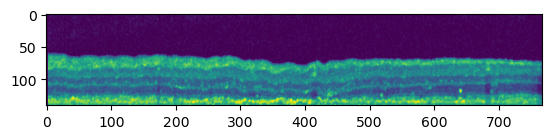

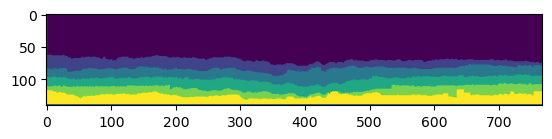

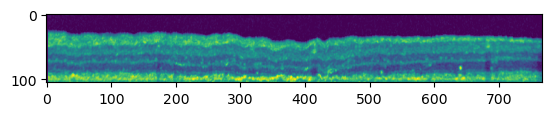

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle


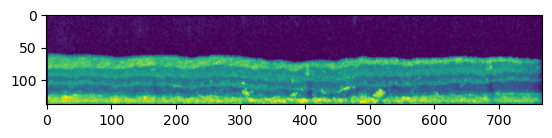

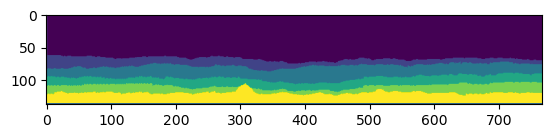

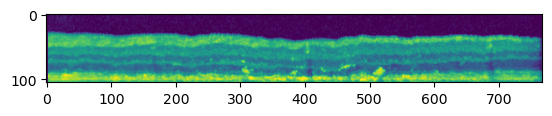

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle


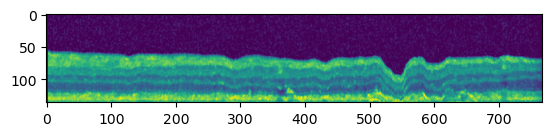

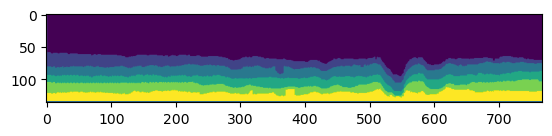

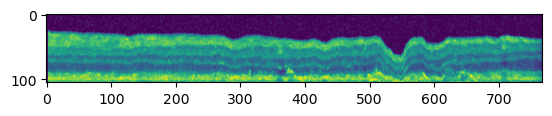

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle


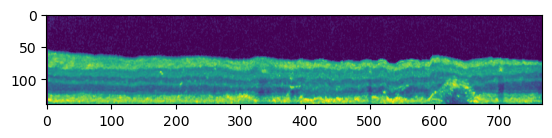

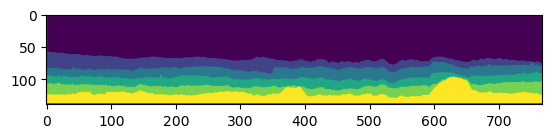

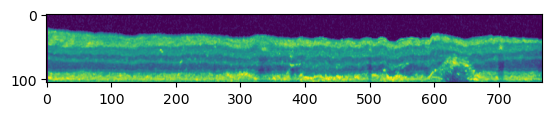

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_right.pickle


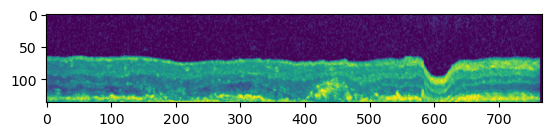

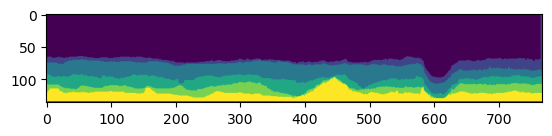

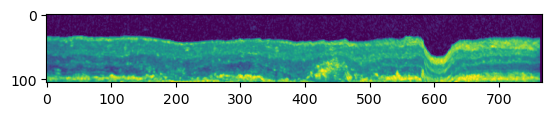

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_right.pickle


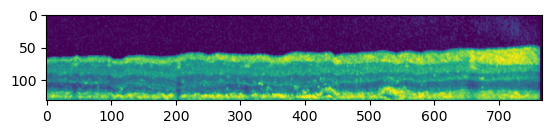

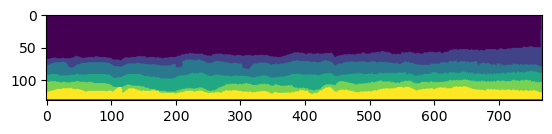

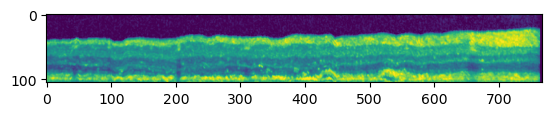

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_right.pickle


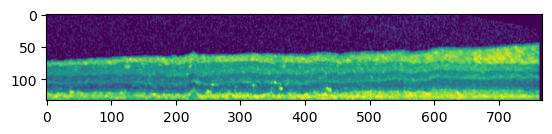

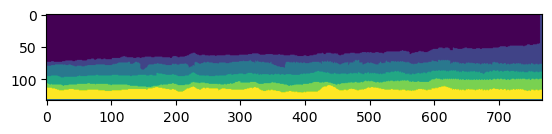

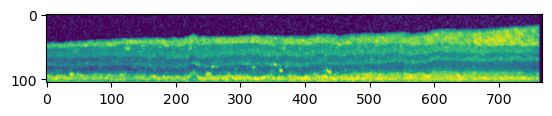

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_12_left.pickle


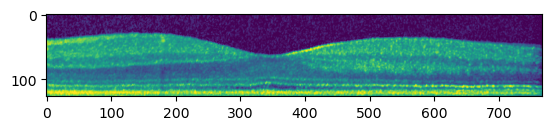

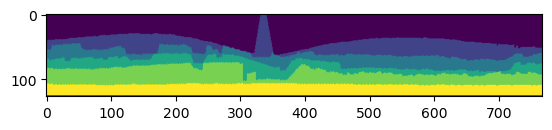

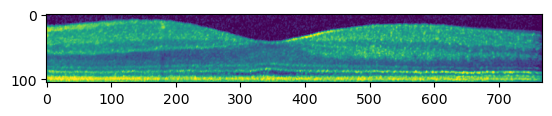

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_left.pickle


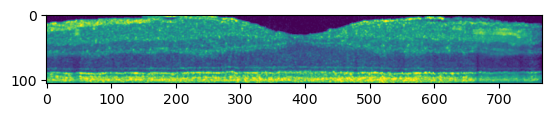

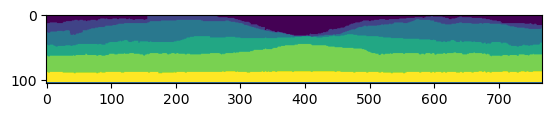

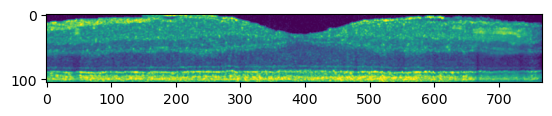

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_left.pickle


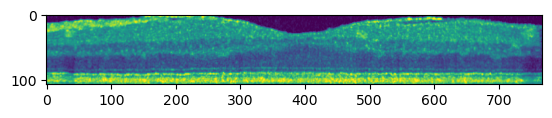

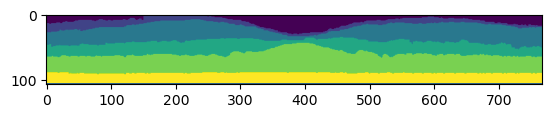

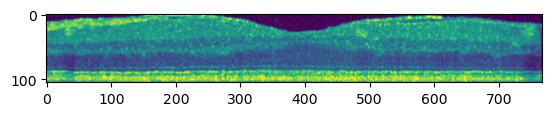

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_left.pickle


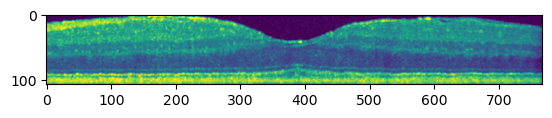

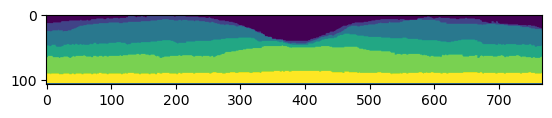

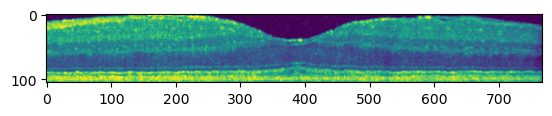

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_left.pickle


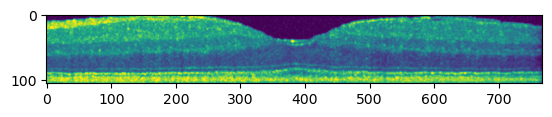

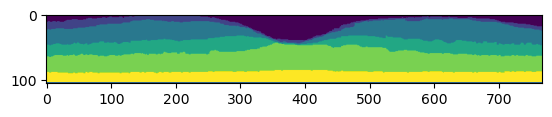

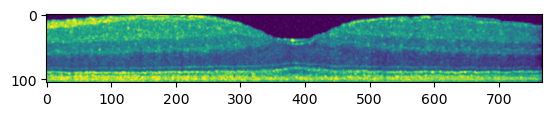

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_left.pickle


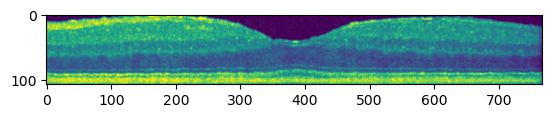

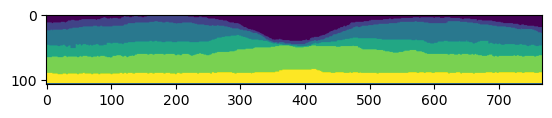

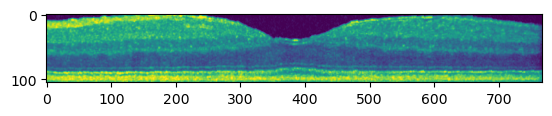

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_left.pickle


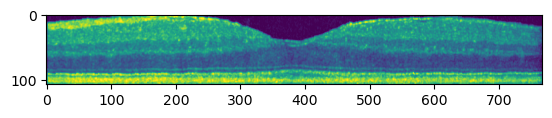

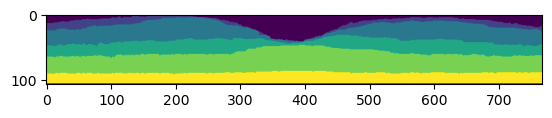

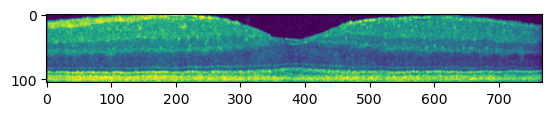

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_left.pickle


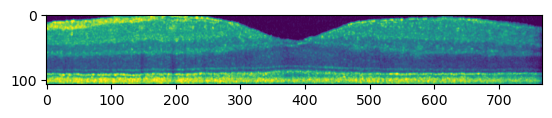

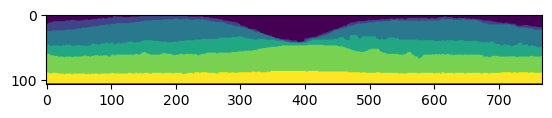

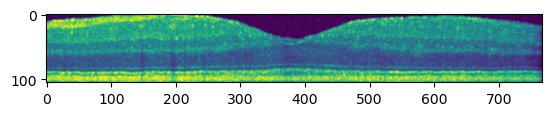

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_left.pickle


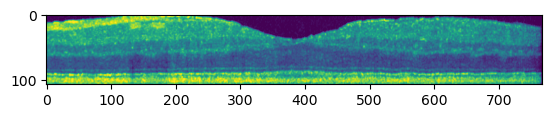

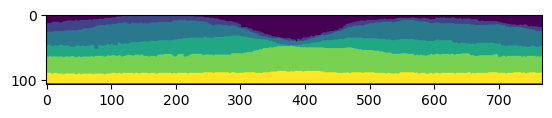

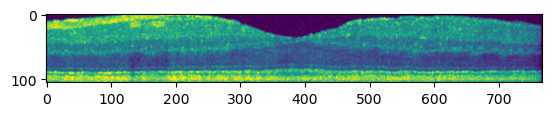

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_left.pickle


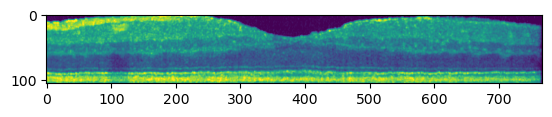

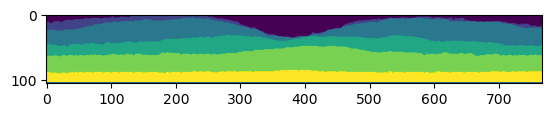

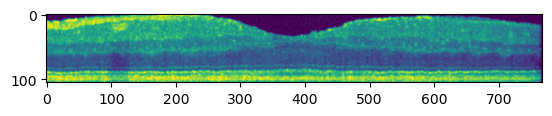

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_left.pickle


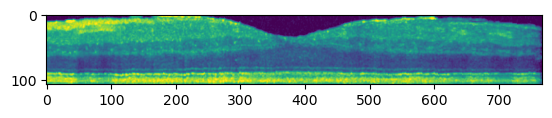

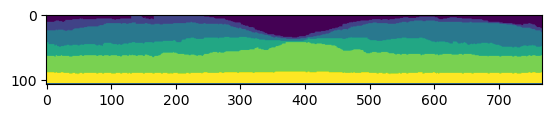

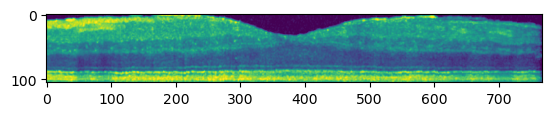

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_right.pickle


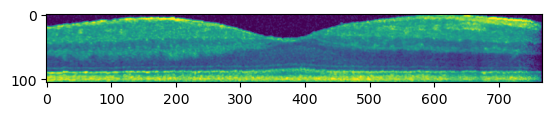

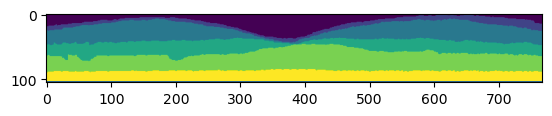

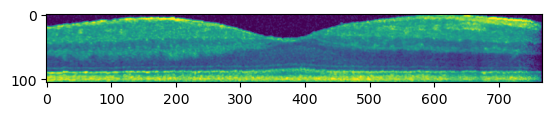

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_right.pickle


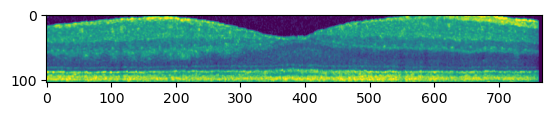

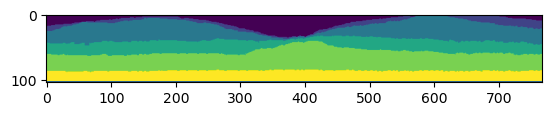

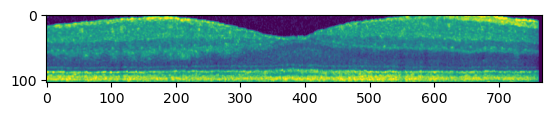

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_right.pickle


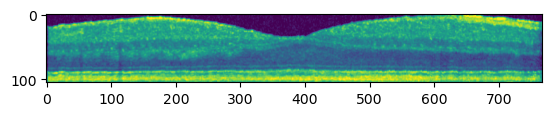

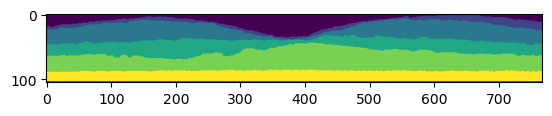

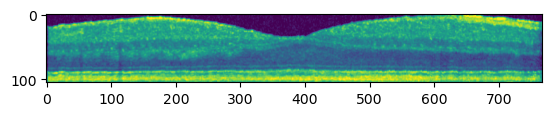

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_right.pickle


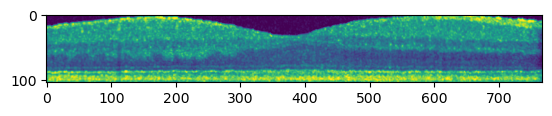

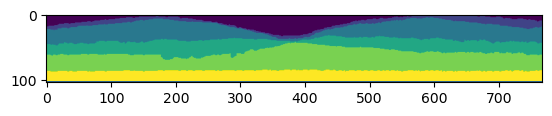

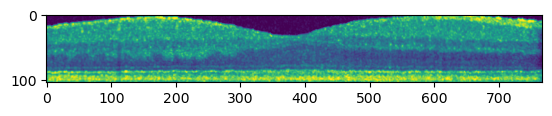

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_right.pickle


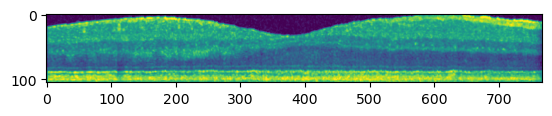

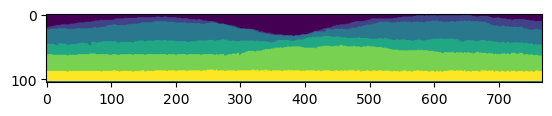

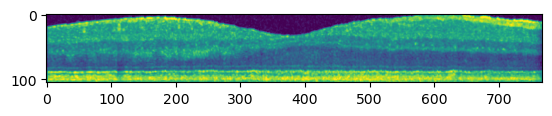

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_right.pickle


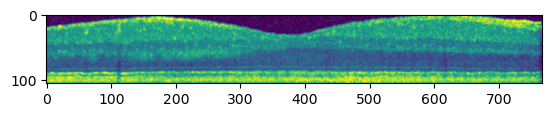

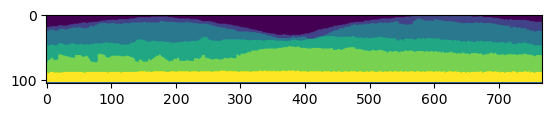

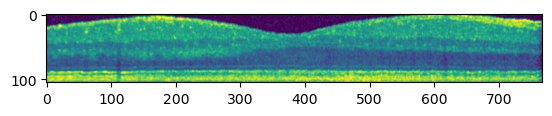

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_right.pickle


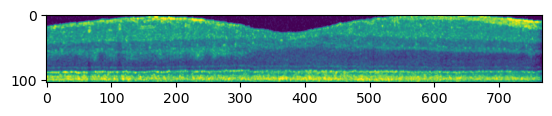

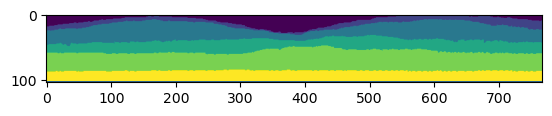

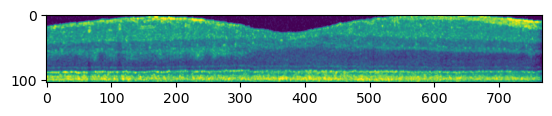

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_right.pickle


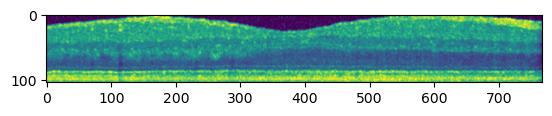

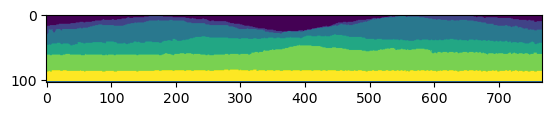

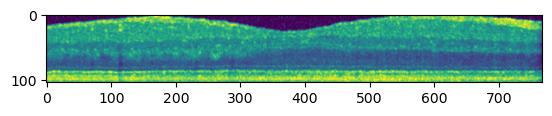

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_right.pickle


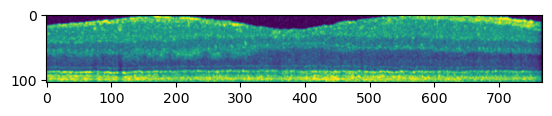

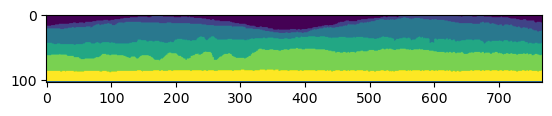

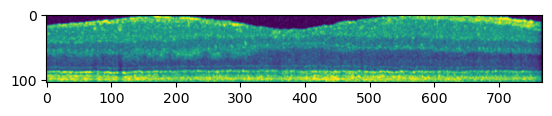

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_3_right.pickle


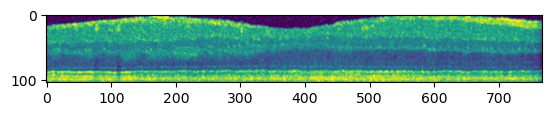

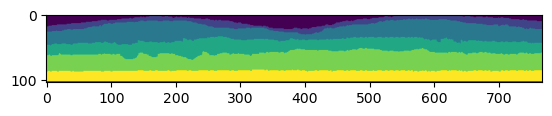

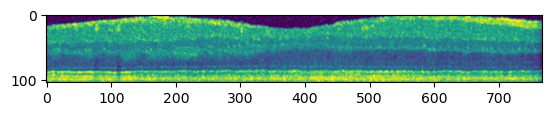

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_8_left.pickle


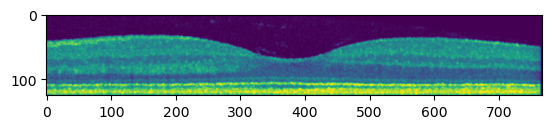

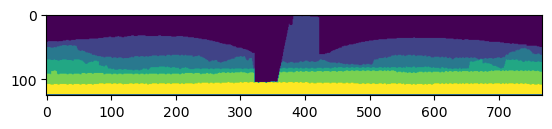

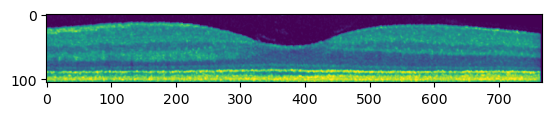

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_8_right.pickle


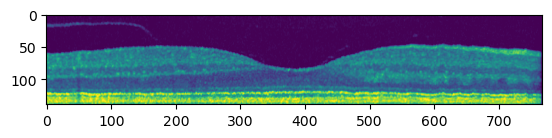

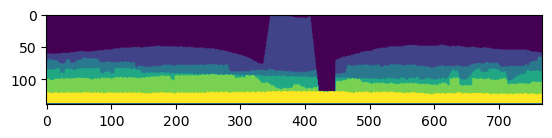

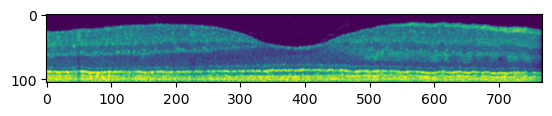

OK
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_8_right.pickle


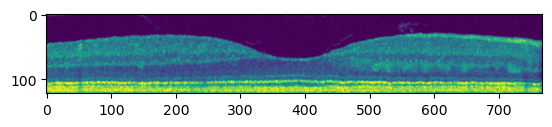

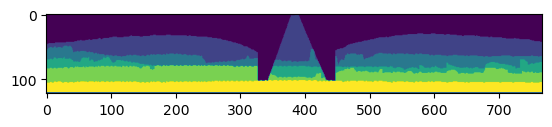

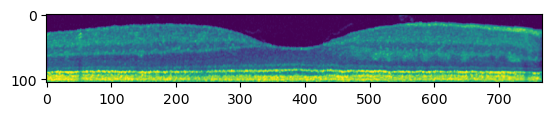

0

In [14]:
checkThickness2(root_path)

In [15]:
def checkThick(root_path,root_save_path):
    paths =  glob.glob(os.path.join(root_path + '\*.pickle'))
    thk = []
    imgs = []
    for path in paths:
        PPocts = pd.read_pickle(path)
        for PPoct in PPocts:
            try:
                #print(PPoct.image().shape[1])
                thk.append(PPoct.image().shape[0])
                if (PPoct.image().shape[0] > 130):
                    imgs.append(PPoct.image())
                    #print(path)
            except:
                continue
    return thk,imgs

root_path =      r'C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs' 
root_save_path = r'C:\Users\line\Desktop\Mauro\3_DataSet' 
thk,imgs = checkThick(root_path,root_save_path)  

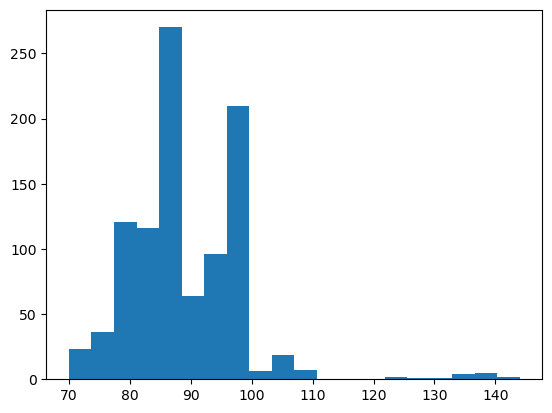

In [16]:
#PLOT HISTOGRAM
plt.hist(thk, bins = 20)
plt.show()

(668160, 5) (668160,) (71424, 5) (71424,)
(739584, 5) (739584,)


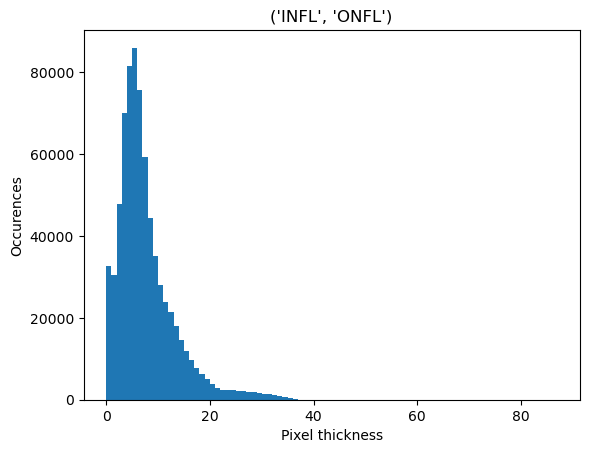

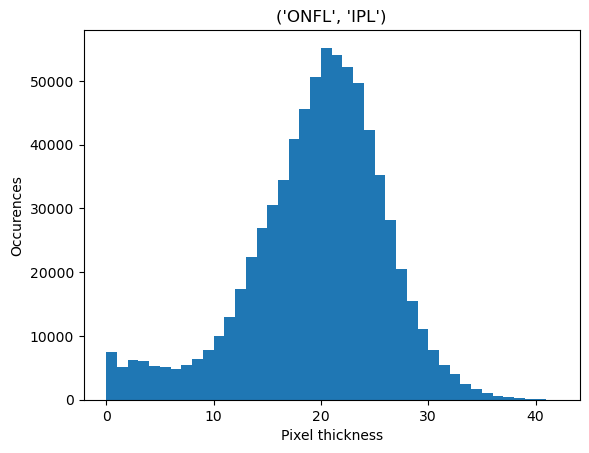

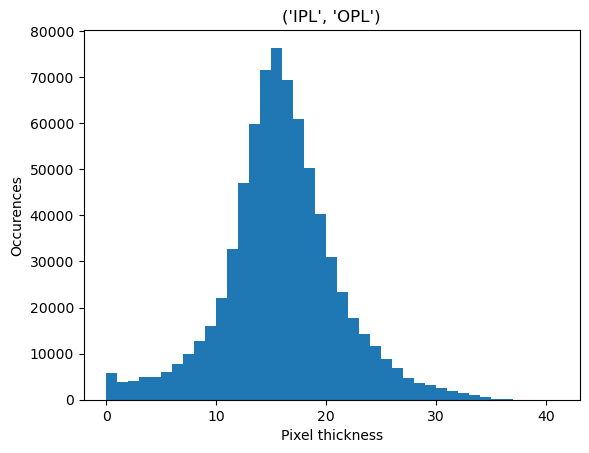

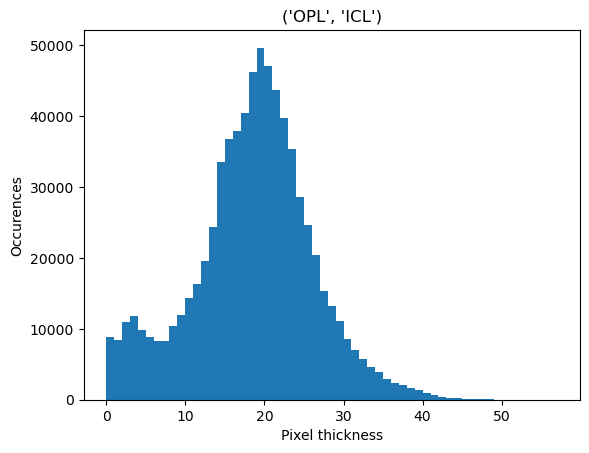

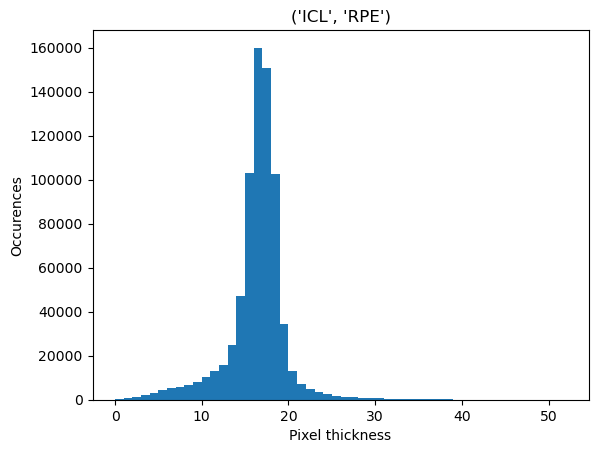

In [17]:
X_train, X_test, y_train, y_test = open_dataset(mode ='thickness',normmode = 'Z-score',samplingmode = '')
print (X_train.shape,y_train.shape,X_test.shape,y_test.shape)
X = np.concatenate((X_train, X_test), axis=0)
y = np.concatenate((y_train, y_test), axis=0)
print (X.shape,y.shape)

LABELS_TO_LAYERS = {
    1: ('INFL', 'ONFL'),
    2: ('ONFL', 'IPL'),
    3: ('IPL', 'OPL'),
    4: ('OPL', 'ICL'),
    5: ('ICL', 'RPE')
}
nlayers = 5
for i in range(nlayers):
    layer = X[:,i]
    plt.title(LABELS_TO_LAYERS[i+1])
    plt.ylabel('Occurences')
    plt.xlabel('Pixel thickness')

    plt.hist(layer,bins = int(layer.max()))
    plt.show()

A really intresting question: Which layer has more predictive power? In practice will probably tell us which layer modifies more when the fixation is different. To asses it we can use recursive feature selection.

In [ ]:
from sklearn.datasets import make_friedman1
from sklearn.feature_selection import RFE

X_train, X_test, y_train, y_test = open_dataset(mode ='thickness',normmode = '',samplingmode = 'U')

estimator = LinearSVC(random_state=0, tol=1e-5)
selector = RFE(estimator)
selector = selector.fit(X_train, y_train)
print(selector.ranking_)

In [67]:
def checklabels(root_path):
    count = 0
    amdthk = []
    controlthk = []
    paths =  glob.glob(os.path.join(root_path + '\*.pickle'))
    for path in paths:
        PPocts = pd.read_pickle(path)
        group = path.split("\\").pop().split("_")[0]
        for PPoct in PPocts:
            if PPoct.image().shape[0] > 100:
                if PPoct.image().shape[0] > 120:
                    print("OK")
                print(path)
                img = PPoct.image()
                segmentation = PPoct
                plt.imshow(img)
                plt.show()
                img2 = PPoct.labelled_segmentation()
                plt.imshow(img2)
                plt.show()
                plt.imshow(img[-105::,:])
                plt.show()
            if group == 'amd':
                amdthk.append(PPoct.image().shape[0])
            else: 
                controlthk.append(PPoct.image().shape[0])
                                  
    return count

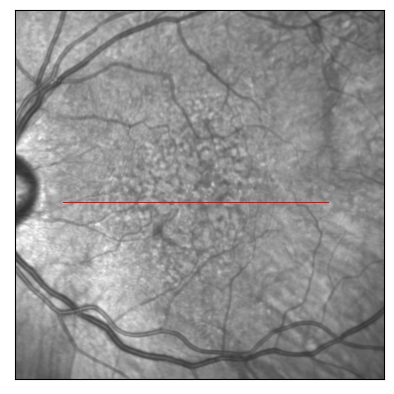

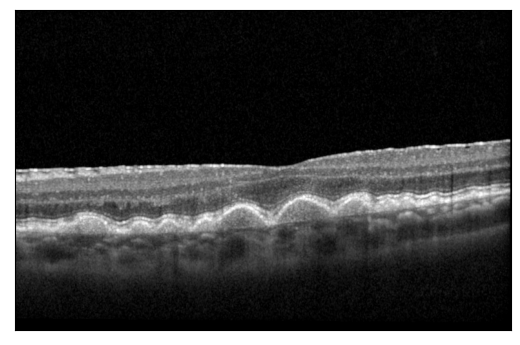

In [15]:
fundus = r'C:\Users\line\Desktop\Mauro\raw_dataset\amd\spectralis\fundus\caj_left.tif' 
import matplotlib.image as mpimg
img = mpimg.imread(fundus)
path = DATAPATHS["preprocessed"] + '\\amd_0_left.pickle'
PPocts = pd.read_pickle(path)
for PPoct in PPocts:
    fig = plt.imshow(img)
    start = PPoct.scan_data().oct_scan.start
    xstart = start[0]
    ystart = start[1]
    end = PPoct.scan_data().oct_scan.end
    xend = end[0]
    yend = end[1]
    ynew = PPoct.label()
    predictions = ynew#clf.predict(xnew)
    N = len(ynew)

    plt.plot([100,650],[400,400], color="red", linewidth=0.5)
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
    #to draw predictions

#     seqX = [xstart- 250 + (xend - xstart)*(i/N) for i in range(N+1)] 
#     seqY = [ystart - 250 + (yend - ystart)*(i/N) for i in range(N+1)] 

#     # Draw predictions
#     for i in range(N):
#         if predictions[i] == 1:
#             plt.plot([seqY[i],seqY[i+1]],[seqX[i],seqX[i+1]], color="red", linewidth=0.5)
#         else:
#             plt.plot([seqY[i],seqY[i+1]],[seqX[i],seqX[i+1]], color="red", linewidth=0.5)

plt.show()

fundus = r'C:\Users\line\Desktop\Mauro\0_backup_folder_development\AMD\raw_dataset\amd\spectralis\oct\caj_left_center\1aa8acf0.tif' 
import matplotlib.image as mpimg
img = mpimg.imread(fundus)

fig = plt.imshow(img)

fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)

plt.show()

In [68]:
# Creation of NP arrays X and y
import cv2

paths = glob.glob(os.path.join(root_path + '\*.pickle'))
def checkLabels(paths):  
    starts = []
    stops = []
    group = []
    y = np.empty((0,))
    for path in paths:
        PPocts = pd.read_pickle(path)
        for PPoct in PPocts:
            group.append(path.split("\\").pop().split("_")[0])
            ynew = PPoct.label()
            #stack vertically the x and y
            BCEA = np.argwhere(ynew==1)
            start = BCEA[0]
            starts.append(start[0])
            stop = BCEA[-1]
            stops.append(stop[0])
            y = np.hstack((y,ynew)) 
    return np.array(starts),np.array(stops),np.array(group)
#starts,stops,y = checkLabels(paths)
starts,stops,groups = checkLabels(paths)

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_0_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_0_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_0_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_0_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_0_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_0_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_0_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_0_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_0_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_0_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_0_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\control_0_left.pickle
C:\Users\line\De

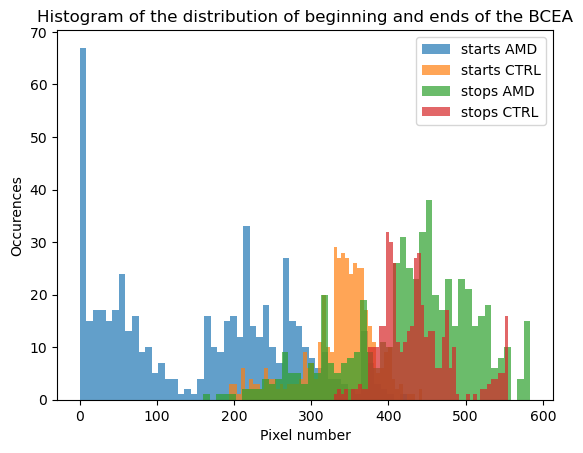

In [74]:

startsAMD = starts[groups == 'amd']
startsCTRL = starts[groups != 'amd']
stopsAMD = stops[groups == 'amd']
stopsCTRL = stops[groups != 'amd']


plt.hist(startsAMD, bins=50,alpha=0.7,label = 'starts AMD')
plt.hist(startsCTRL, bins=50,alpha=0.7,label = 'starts CTRL')
plt.hist(stopsAMD, bins=50,alpha=0.7,label = 'stops AMD')
plt.hist(stopsCTRL, bins=50,alpha=0.7,label = 'stops CTRL')
plt.xlabel('Pixel number')
plt.ylabel('Occurences')
plt.title('Histogram of the distribution of beginning and ends of the BCEA')
plt.legend()
plt.show()

In [62]:
lensAMD =  [stopsAMD[i] - startsAMD[i] for i in range(len(stopsAMD))]
lensCTRL = [stopsCTRL[i] - startsCTRL[i] for i in range(len(stopsCTRL))]

In [66]:
np.array(lensCTRL) 

array([328, 328, 330, 330, 332, 332, 332, 330, 330, 330, 328, 326, 324,
       322, 320, 320, 316, 312, 310, 306, 302, 300, 296, 292, 286, 283,
       277, 271, 267, 259, 253, 247, 237, 227, 221, 210, 198, 190, 174,
       158, 148, 125, 106,  73,  38,  54,  88, 111, 127, 146, 158, 172,
       183, 192, 201, 212, 217, 225, 232, 238, 251, 247, 239, 232, 224,
       216, 207, 198, 190, 175, 163, 145, 112,  88,  44,  42,  40,  34,
        28,  15,  14,  28,  33,  38,  42,  44,  46,  45,  44,  40,  33,
        27,  18,  17,  28,  31,  35,  39,  40,  41,  41,  42,  40,  28,
        36,  44,  46,  45,  42,  37,  25,  23,  35,  42,  43,  44,  40,
        24,  21,  33,  37,  33,  25,  13,  27,  31,  34,  32,  29,  23,
        19,  28,  49,  40,  52,  30,  19,  50,  66,  78,  84,  90,  96,
       100, 100, 102, 100,  96,  94,  83,  76,  71,  63,  56,  42,  22,
        19,  40,  53,  64,  73,  79,  82,  87,  91,  95,  95,  97,  99,
        99,  99,  99,  97,  95,  95,  91,  39,  25,  27,  37,  4

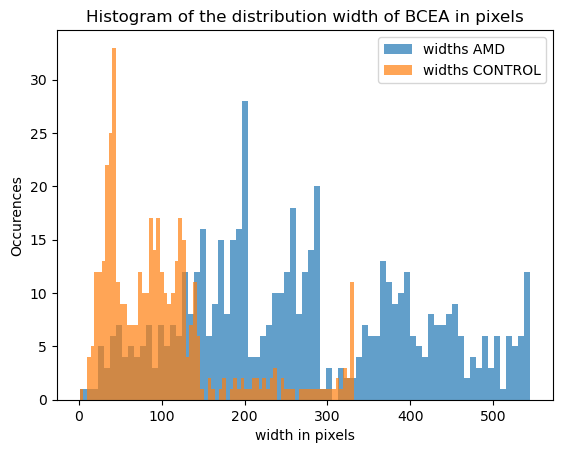

In [73]:
plt.hist(lensAMD, bins=75,alpha=0.7,label = 'widths AMD')
plt.hist(lensCTRL, bins=75,alpha=0.7,label = 'widths CONTROL')
plt.title('Histogram of the distribution width of BCEA in pixels')
plt.xlabel('width in pixels')
plt.ylabel('Occurences')
plt.legend()
plt.show()

In [69]:
# Creation of NP arrays X and y
import cv2

paths = glob.glob(os.path.join(root_path + '\*.pickle'))
def checkLabels(paths):  
    starts = []
    stops = []
    y = np.empty((0,))
    for path in paths:
        PPocts = pd.read_pickle(path)
        for PPoct in PPocts:
            ynew = PPoct.label()
            #stack vertically the x and y
            BCEA = np.argwhere(ynew==1)
            start = BCEA[0]
            stop = BCEA[-1]
            # Check the end of the tail for the amd
            if(stop - start > 500):
                print(path)
            # Check the end of the tail for the control
            if path.split("\\").pop().split("_")[0] != 'amd' and (stop - start) > 300:
                print(path)
checkLabels(paths)

C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_6_left.pickle
C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_

GROUP: amd


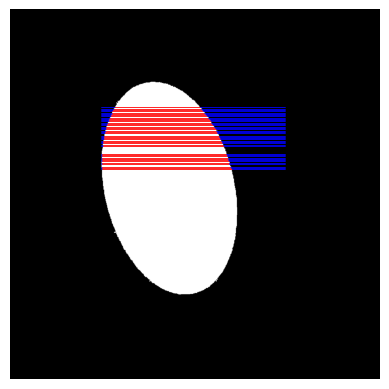

HERE


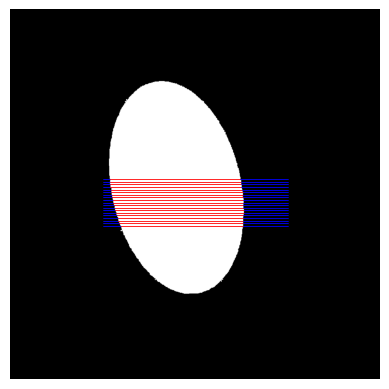

HERE


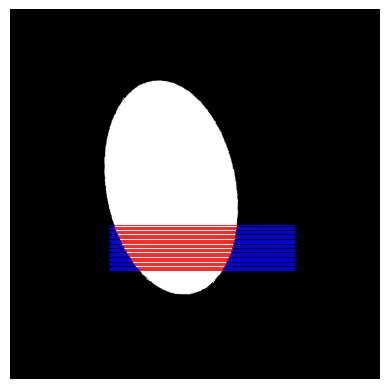

GROUP: control


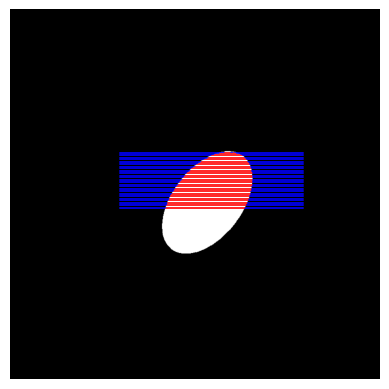

HERE


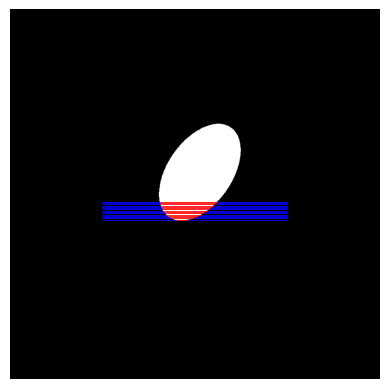

In [70]:
# Let's keep the paths of the top 30% size BCEA for amd of the data and look at where are the OCT lines in WRT the the ellipse
# Si puo controllare se c é un problema nel data collection process, che potenzialmente introduce un bias, siccome il rapporto tra dimensione e numero di oct é un po diverso
# No é solo perche é proporzionale al diametro e non all'area
def visualizePredictions(paths, mode,clf = None,rootpath = None,normmode = 'Z-score'):
    def normalize(img,mode = 'Z-score'):
        if mode == 'Z-score':
            normalized_img = dataset.z_score(img)
        elif mode == 'EQ-hist': 
            normalized_img = exposure.equalize_hist(img)
        elif mode == 'CLAHE':
            #TO Implement normalization by zone
            # Adaptive Equalization
            normalized_img = exposure.equalize_adapthist(img/max((img.max(),-img.min())), clip_limit=0.03)            
        return normalized_img
    
    def getxmax(rootpath):
        themax = 0
        allpaths =  glob.glob(os.path.join(root_path + '\*.pickle'))
        for path in allpaths:
            PPocts = pd.read_pickle(path)
            for PPoct in PPocts:
                xnew = PPoct.image()
                if(xnew.shape[0] > themax):
                    themax = xnew.shape[0]
        return themax
    
    if mode == 'thickness':
        #xmax is the number of layers
        xmax = 5 
    elif mode =='raw':
        xmax = getxmax(rootpath) 

    for path in paths:
        group = path.split("\\").pop().split("_")[0]
        print(f'GROUP: {group}')
        PPocts = pd.read_pickle(path)
        if len(PPocts) != 0:
            img = Image.fromarray(PPocts[0].full_label())
            plt.imshow(img)
            plt.axis('off')
        for PPoct in PPocts:
            if ((PPoct.full_label() != img)).any():
                plt.show()
                print("HERE")
                img = Image.fromarray(PPoct.full_label())
                plt.imshow(img)
            start = PPoct.scan_data().oct_scan.start
            xstart = start[0]
            ystart = start[1]
            end = PPoct.scan_data().oct_scan.end
            xend = end[0]
            yend = end[1]
            if mode == 'thickness':
                xnew = np.transpose(PPoct.thicknesses())
            elif mode == 'raw':
                xnew = np.transpose(normalize(PPoct.image(),mode = normmode))
                xnew = np.pad(xnew, ((0, 0), (xmax - xnew.shape[1], 0)), 'constant')
            ynew = PPoct.label()
            predictions = ynew#clf.predict(xnew)
            N = len(ynew)
            
            #to draw predictions

            seqX = [xstart + (xend - xstart)*(i/N) for i in range(N+1)] 
            seqY = [ystart + (yend - ystart)*(i/N) for i in range(N+1)] 

            # Draw predictions
            for i in range(N):
                if predictions[i] == 1:
                    plt.plot([seqY[i],seqY[i+1]],[seqX[i],seqX[i+1]], color="red", linewidth=0.5)
                else:
                    plt.plot([seqY[i],seqY[i+1]],[seqX[i],seqX[i+1]], color="blue", linewidth=0.5)
        
        plt.show()
        
root_path = DATAPATHS["preprocessed"]

visualizePredictions(glob.glob(os.path.join(root_path + '\*.pickle')), 'raw',clf = None,rootpath = None,normmode = 'Z-score')